<a href="https://colab.research.google.com/github/thomasp3450/CV-project-IAT360/blob/main/CV-Project-IAT360.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [13]:
import ultralytics
ultralytics.checks()
import torch

Ultralytics 8.3.220  Python-3.13.7 torch-2.9.0+cpu CPU (AMD Ryzen 7 5800X 8-Core Processor)
Setup complete  (16 CPUs, 31.9 GB RAM, 866.4/931.4 GB disk)


In [1]:
import yaml
import os

def create_data_yaml(classes_path, data_yaml_path): #create yaml file
    with open(classes_path, 'r') as f:
        classes = []
        for line in f.readlines():
            if len(line.strip()) == 0: continue
            classes.append(line.strip())
    number_of_classes = len(classes)


    data = {
        'path' : 'Documents/GitHub/CV-project-IAT360/ourdata',
        'train' : 'images/train',
        'val' : 'images/val',
        'nc' : number_of_classes,
        'names' : classes
    }

    with open(data_yaml_path, 'w') as f: #print out the path for the yaml file
        yaml.dump(data, f, sort_keys=False)
        print(f'Data YAML file created at {data_yaml_path}')
    return

# Define path to classes.txt and run function
path_to_classes_txt = 'Documents/GitHub/CV-project-IAT360/ourdata/classes.txt'
path_to_data_yaml = 'Documents/GitHub/CV-project-IAT360/ourdata/data.yaml'

create_data_yaml(path_to_classes_txt, path_to_data_yaml)



Data YAML file created at Documents/GitHub/CV-project-IAT360/ourdata/data.yaml


In [6]:
!yolo detect train data=data.yaml model=yolov8n.pt epochs=35 imgsz=640

New https://pypi.org/project/ultralytics/8.3.221 available  Update with 'pip install -U ultralytics'
Ultralytics 8.3.220  Python-3.13.7 torch-2.9.0+cpu CPU (AMD Ryzen 7 5800X 8-Core Processor)
engine\trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=data.yaml, degrees=0.0, deterministic=True, device=cpu, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=35, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8n.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=train31, nbs=64, nms=False, opset=None, optimize

In [7]:
!yolo detect predict model=runs/detect/train31/weights/best.pt source=Documents/GitHub/CV-project-IAT360/ourdata/images/val save=True

Ultralytics 8.3.220  Python-3.13.7 torch-2.9.0+cpu CPU (AMD Ryzen 7 5800X 8-Core Processor)
Model summary (fused): 72 layers, 3,006,233 parameters, 0 gradients, 8.1 GFLOPs

image 1/30 C:\Users\Thomas\Documents\GitHub\CV-project-IAT360\ourdata\images\val\1.jpg: 448x640 2 Vehicles, 40.1ms
image 2/30 C:\Users\Thomas\Documents\GitHub\CV-project-IAT360\ourdata\images\val\10.jpg: 480x640 2 Hydrants, 40.0ms
image 3/30 C:\Users\Thomas\Documents\GitHub\CV-project-IAT360\ourdata\images\val\11.jpg: 384x640 1 Hydrant, 37.1ms
image 4/30 C:\Users\Thomas\Documents\GitHub\CV-project-IAT360\ourdata\images\val\12.jpg: 448x640 (no detections), 29.7ms
image 5/30 C:\Users\Thomas\Documents\GitHub\CV-project-IAT360\ourdata\images\val\13.jpg: 480x640 1 Vehicle, 31.0ms
image 6/30 C:\Users\Thomas\Documents\GitHub\CV-project-IAT360\ourdata\images\val\14.jpg: 384x640 2 Hydrants, 26.0ms
image 7/30 C:\Users\Thomas\Documents\GitHub\CV-project-IAT360\ourdata\images\val\15.jpg: 448x640 1 Hydrant, 28.3ms
image 8/30 C:\

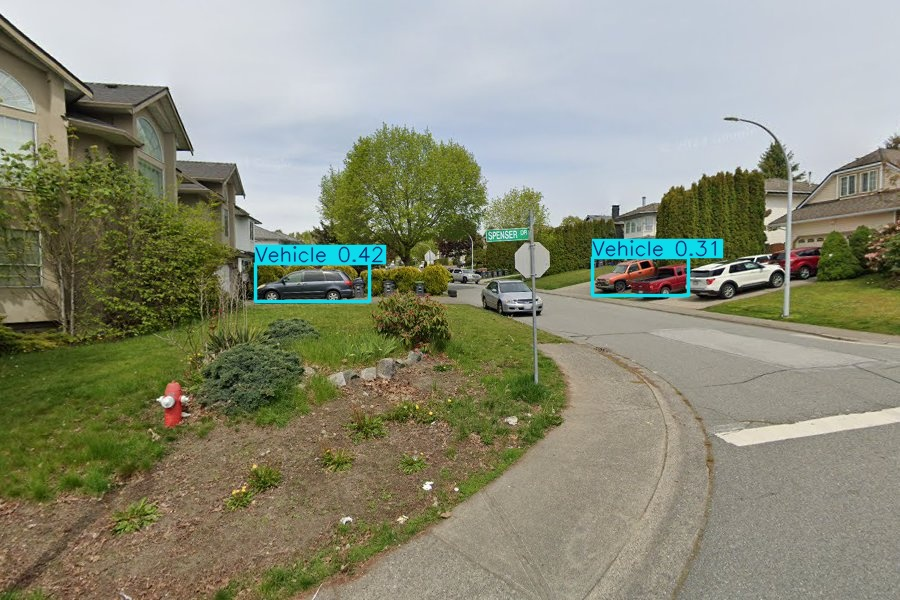

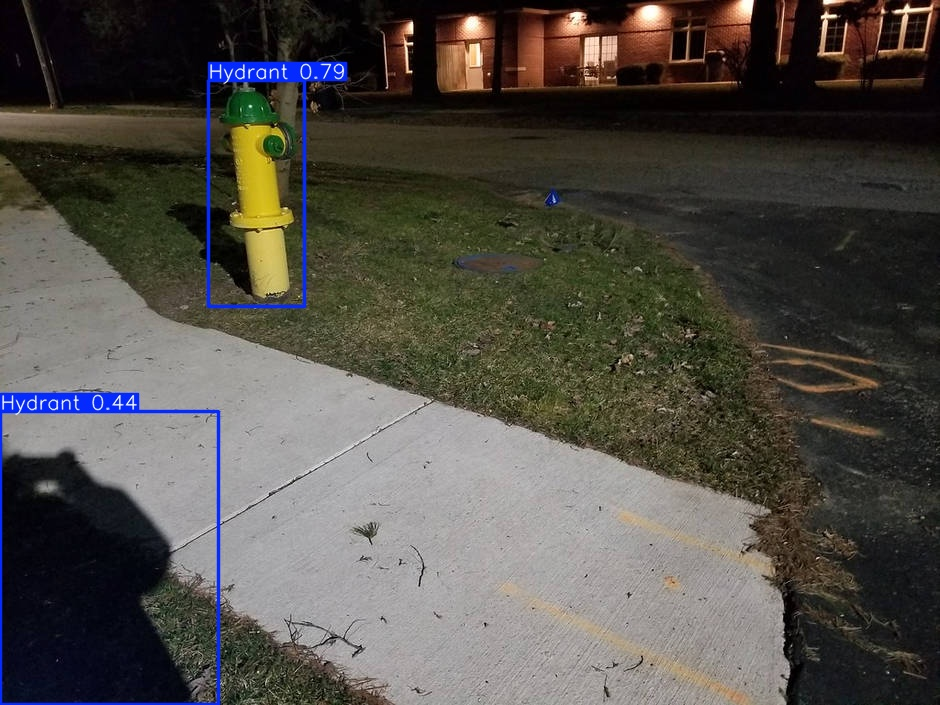

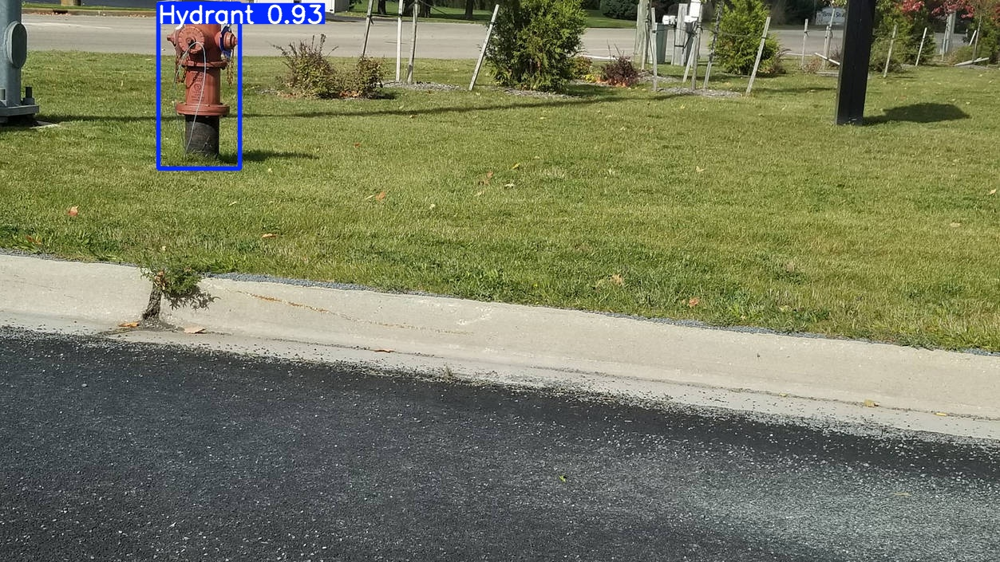

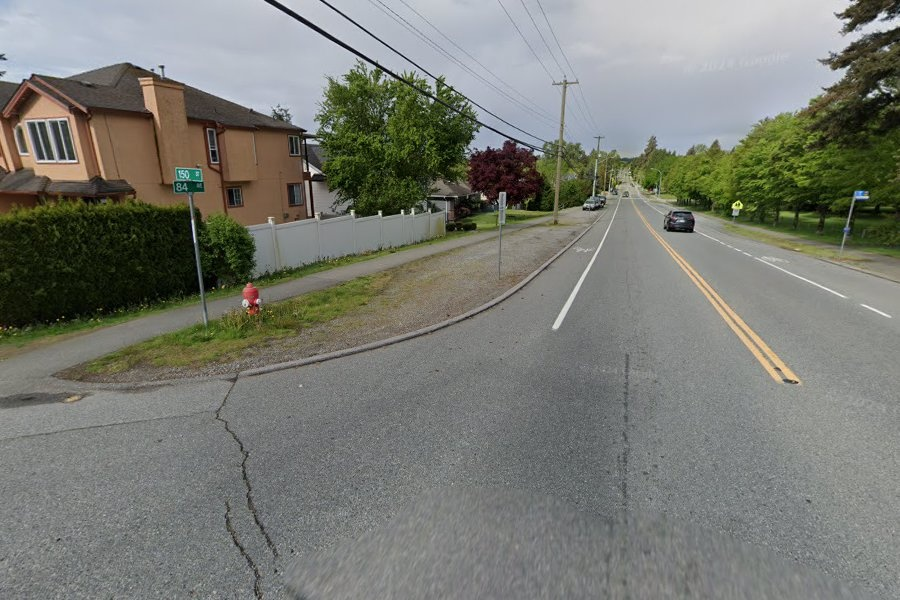

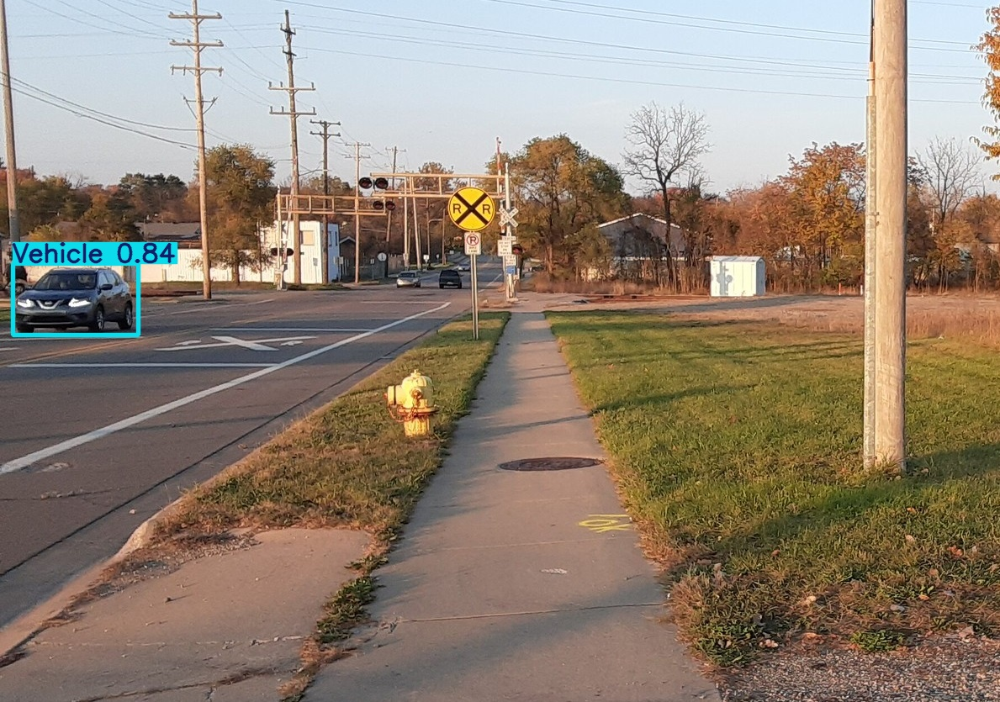

...

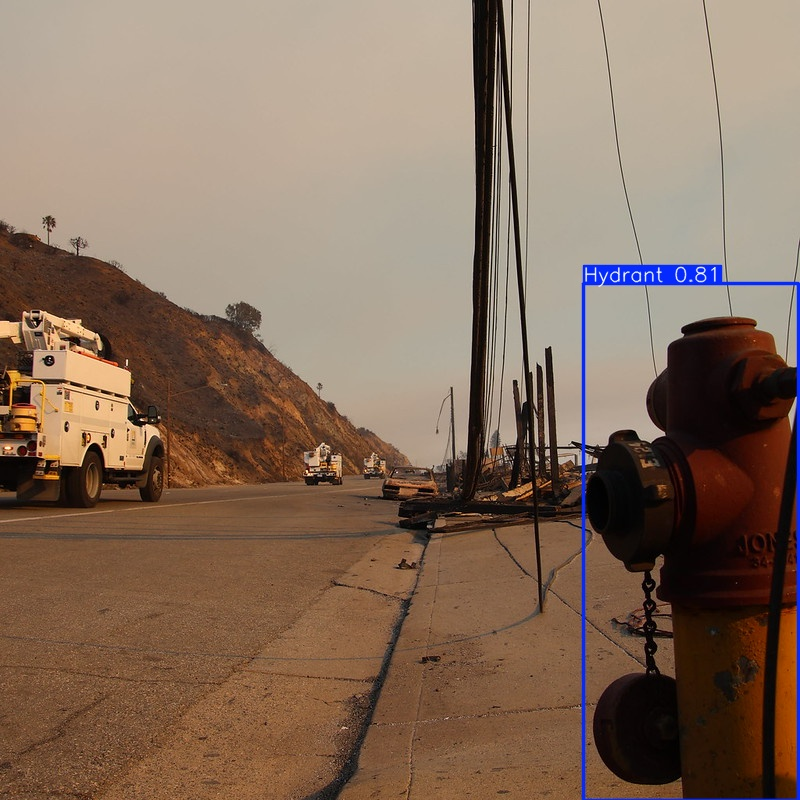

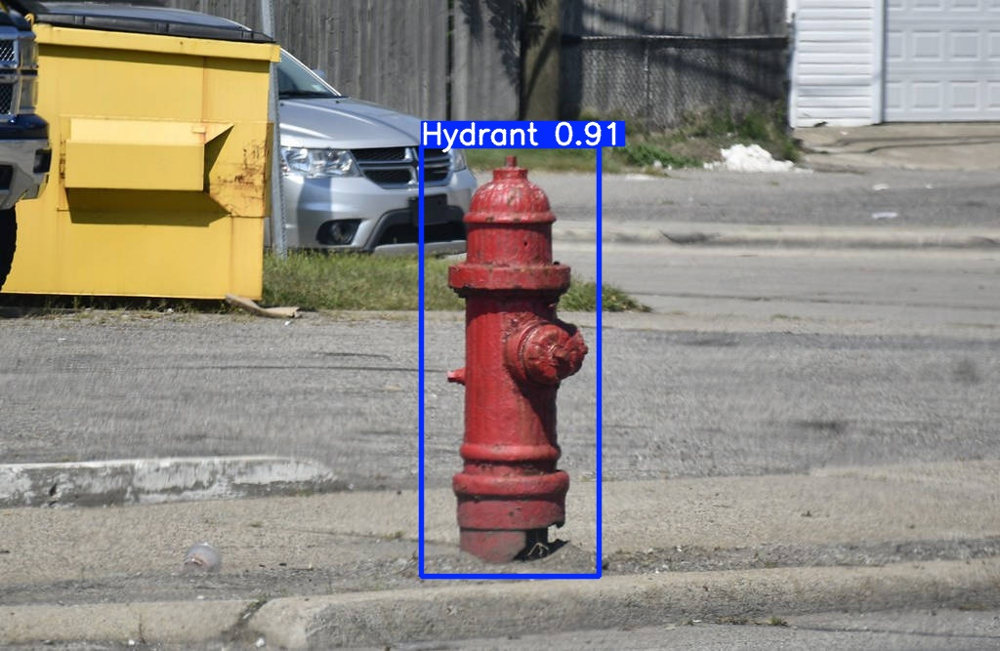

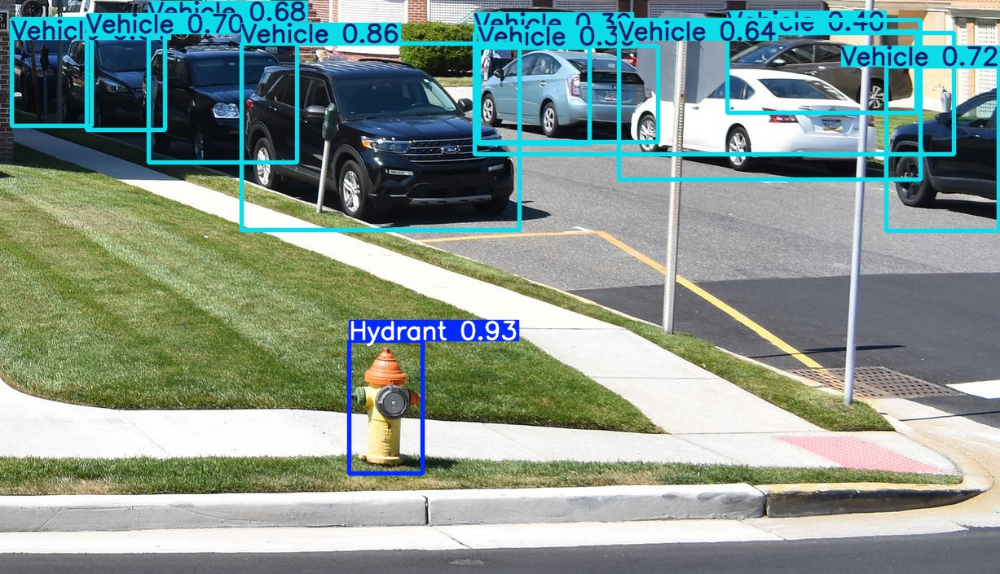

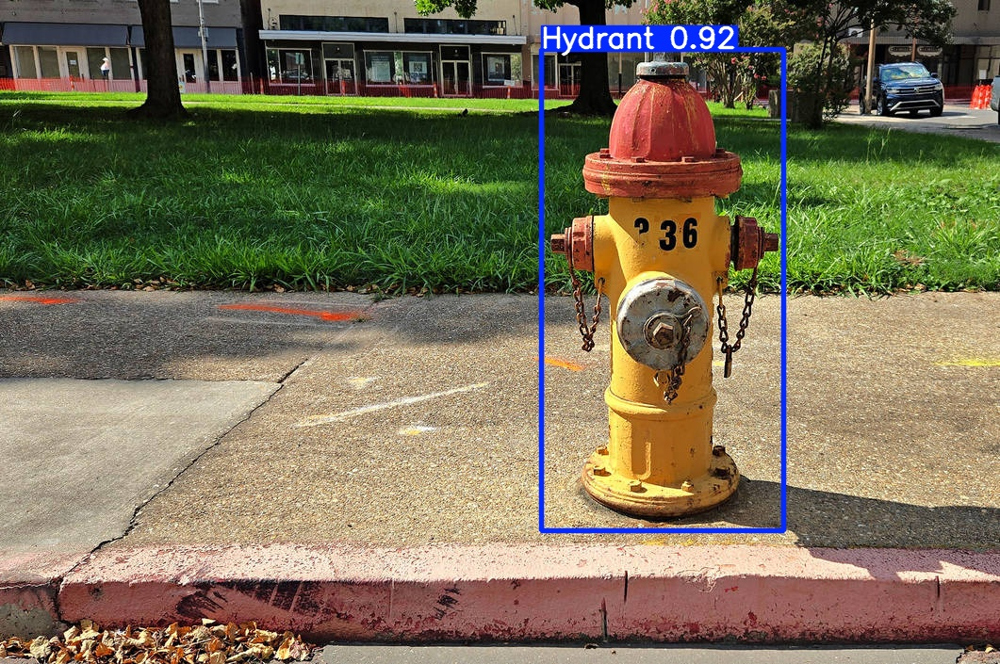

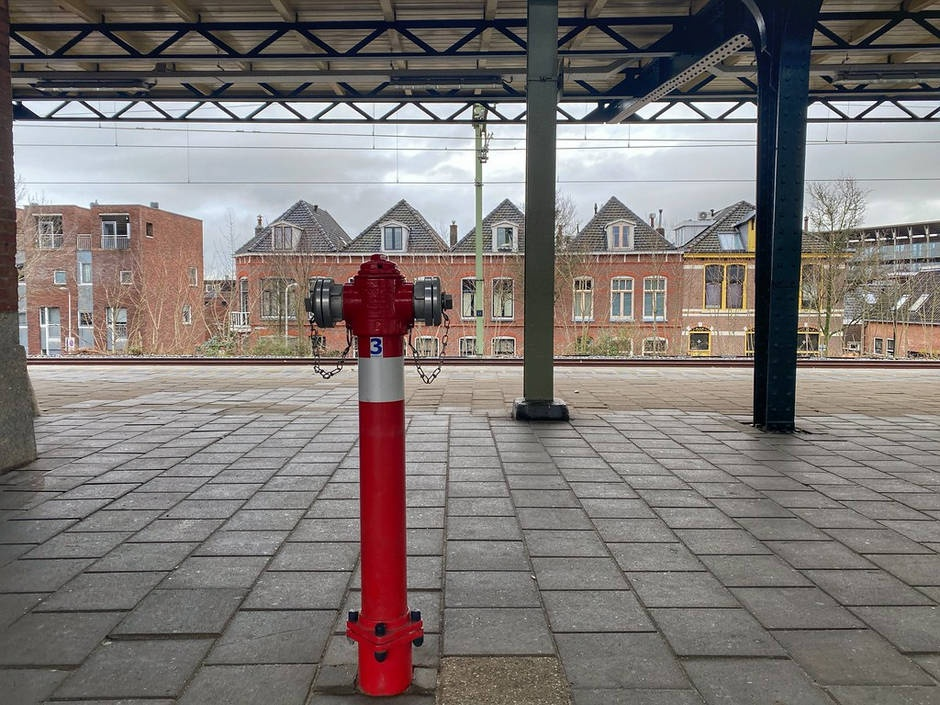

In [8]:
import glob
from IPython.display import Image, display

for imageName in glob.glob('runs/detect/predict4/*.jpg'):
    display(Image(filename=imageName))
    print("\n")

In [18]:
# Create "my_model" folder to store model weights and train results
!mkdir my_model
!copy runs\detect\train31\weights\best.pt my_model\my_model.pt
!xcopy /E /I runs\detect\train31 my_model\train

# Zip into "my_model.zip"
%cd my_model
!zip ..\my_model.zip my_model.pt
!zip -r ..\my_model.zip train
%cd ..

A subdirectory or file my_model already exists.


        1 file(s) copied.
runs\detect\train31\args.yaml
runs\detect\train31\BoxF1_curve.png
runs\detect\train31\BoxPR_curve.png
runs\detect\train31\BoxP_curve.png
runs\detect\train31\BoxR_curve.png
runs\detect\train31\confusion_matrix.png
runs\detect\train31\confusion_matrix_normalized.png
runs\detect\train31\labels.jpg
runs\detect\train31\results.csv
runs\detect\train31\results.png
runs\detect\train31\train_batch0.jpg
runs\detect\train31\train_batch1.jpg
runs\detect\train31\train_batch2.jpg
runs\detect\train31\train_batch475.jpg
runs\detect\train31\train_batch476.jpg
runs\detect\train31\train_batch477.jpg
runs\detect\train31\val_batch0_labels.jpg
runs\detect\train31\val_batch0_pred.jpg
runs\detect\train31\weights\best.pt
runs\detect\train31\weights\last.pt
20 File(s) copied
C:\Users\Thomas\my_model


'zip' is not recognized as an internal or external command,
operable program or batch file.


C:\Users\Thomas


'zip' is not recognized as an internal or external command,
operable program or batch file.
